<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Data-Description" data-toc-modified-id="Data-Description-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Data Description</a></span></li><li><span><a href="#Imports" data-toc-modified-id="Imports-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>Imports</a></span></li><li><span><a href="#Useful-Scripts" data-toc-modified-id="Useful-Scripts-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>Useful Scripts</a></span></li><li><span><a href="#Load-the-data" data-toc-modified-id="Load-the-data-4"><span class="toc-item-num">4&nbsp;&nbsp;</span>Load the data</a></span></li><li><span><a href="#Train-Validation-Test-Split-with-Stratify" data-toc-modified-id="Train-Validation-Test-Split-with-Stratify-5"><span class="toc-item-num">5&nbsp;&nbsp;</span>Train Validation Test Split with Stratify</a></span></li><li><span><a href="#Model:-LightGBM" data-toc-modified-id="Model:-LightGBM-6"><span class="toc-item-num">6&nbsp;&nbsp;</span>Model: LightGBM</a></span></li><li><span><a href="#HPO-Hyper-Parameter-Optimization-with-Optuna" data-toc-modified-id="HPO-Hyper-Parameter-Optimization-with-Optuna-7"><span class="toc-item-num">7&nbsp;&nbsp;</span>HPO Hyper Parameter Optimization with Optuna</a></span></li><li><span><a href="#LightGBM-cross-validation" data-toc-modified-id="LightGBM-cross-validation-8"><span class="toc-item-num">8&nbsp;&nbsp;</span>LightGBM cross validation</a></span></li><li><span><a href="#Model-Interpretation" data-toc-modified-id="Model-Interpretation-9"><span class="toc-item-num">9&nbsp;&nbsp;</span>Model Interpretation</a></span><ul class="toc-item"><li><span><a href="#Model-interpretation-using-eli5" data-toc-modified-id="Model-interpretation-using-eli5-9.1"><span class="toc-item-num">9.1&nbsp;&nbsp;</span>Model interpretation using eli5</a></span></li><li><span><a href="#Model-interpretation-using-lime" data-toc-modified-id="Model-interpretation-using-lime-9.2"><span class="toc-item-num">9.2&nbsp;&nbsp;</span>Model interpretation using lime</a></span></li><li><span><a href="#Model-interpretation-using-shap" data-toc-modified-id="Model-interpretation-using-shap-9.3"><span class="toc-item-num">9.3&nbsp;&nbsp;</span>Model interpretation using shap</a></span></li></ul></li></ul></div>

# Data Description

The datasets contains transactions made by credit cards in September
2013 by european cardholders.


This dataset presents transactions that occurred in two days,
where we have 492 frauds out of 284,807 transactions. 

The dataset is highly unbalanced, the positive class (frauds)
account for 0.172% of all transactions.

It contains only numerical input variables which are
the result of a PCA transformation.


Unfortunately, due to confidentiality issues,
we cannot provide the original features and 
more background information about the data.


Features V1, V2, ... V28 are the principal
components obtained with PCA,
the only features which have not been transformed with PCA are 'Time' and 'Amount'. 

Feature 'Time' contains the seconds elapsed between each transaction
and the first transaction in the dataset. The feature 'Amount'
is the transaction Amount, this feature can be used for 
example-dependant cost-senstive learning. 

Feature 'Class' is the response variable and it takes value
1 in case of fraud and 0 otherwise.

# Imports

In [1]:
import bhishan

In [2]:
%load_ext autoreload
%autoreload 2

In [3]:
import numpy as np
import pandas as pd
import seaborn as sns
sns.set(color_codes=True)

import matplotlib
import matplotlib.pyplot as plt
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
sns.set(context='notebook', style='whitegrid', rc={'figure.figsize': (12,8)})
plt.style.use('ggplot') # better than sns styles.
matplotlib.rcParams['figure.figsize'] = 12,8

import os
import time

# random state
SEED=100
np.random.seed(SEED)

# Jupyter notebook settings for pandas
#pd.set_option('display.float_format', '{:,.2g}'.format) # numbers sep by comma
pd.options.display.float_format = '{:,}'.format # df.A.value_counts().astype(float)
from pandas.api.types import CategoricalDtype
np.set_printoptions(precision=3)

pd.set_option('display.max_columns', 100)
pd.set_option('display.max_rows', 100) # None for all the rows
pd.set_option('display.max_colwidth', 200)

import IPython
from IPython.display import display, HTML, Image, Markdown

print([(x.__name__,x.__version__) for x in [np, pd,sns,matplotlib]])

[('numpy', '1.16.4'), ('pandas', '0.25.3'), ('seaborn', '0.9.0'), ('matplotlib', '3.1.1')]


In [4]:
import scipy
from scipy import stats

In [5]:
# scale and split
from sklearn.preprocessing import MinMaxScaler, StandardScaler, RobustScaler
from sklearn.model_selection import train_test_split
from sklearn.model_selection import StratifiedKFold

In [6]:
# dimension reduction for visualization
from sklearn.decomposition import PCA
from sklearn.decomposition import TruncatedSVD
from sklearn.manifold import TSNE

In [7]:
# classifiers
from sklearn.linear_model import LogisticRegression
from sklearn.linear_model import SGDClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier

In [8]:
# hyperparameters search
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV
from sklearn.metrics import make_scorer, matthews_corrcoef

In [9]:
# pipelines
from sklearn.pipeline import Pipeline
from sklearn.pipeline import make_pipeline

In [10]:
# prediction
from sklearn.model_selection import cross_val_predict

In [11]:
# model evaluation metrics
from sklearn.model_selection import cross_val_score

In [12]:
# roc auc etc scores
from sklearn.metrics import auc
from sklearn.metrics import roc_auc_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score
from sklearn.metrics import accuracy_score
from sklearn.metrics import average_precision_score

In [13]:
# roc auc curves
from sklearn.metrics import roc_curve
from sklearn.metrics import precision_recall_curve

In [14]:
# confusion matrix
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix

In [15]:
import plotly.offline as py
py.init_notebook_mode(connected=True)
import plotly.graph_objs as go
import plotly.tools as tls
import plotly.figure_factory as ff

# Useful Scripts

In [25]:
def show_method_attributes(obj, ncols=7,start=None, inside=None):
    """ Show all the attributes of a given method.
    Example:
    ========
    show_method_attributes(list)
     """

    print(f'Object Type: {type(obj)}\n')
    lst = [elem for elem in dir(obj) if elem[0]!='_' ]
    lst = [elem for elem in lst 
           if elem not in 'os np pd sys time psycopg2'.split() ]

    if isinstance(start,str):
        lst = [elem for elem in lst if elem.startswith(start)]
        
    if isinstance(start,tuple) or isinstance(start,list):
        lst = [elem for elem in lst for start_elem in start
               if elem.startswith(start_elem)]
        
    if isinstance(inside,str):
        lst = [elem for elem in lst if inside in elem]
        
    if isinstance(inside,tuple) or isinstance(inside,list):
        lst = [elem for elem in lst for inside_elem in inside
               if inside_elem in elem]

    return pd.DataFrame(np.array_split(lst,ncols)).T.fillna('')

def print_scores(ytest,ypreds):
    print(f'Precision: {precision_score(ytest,ypreds): .2f}')
    print(f'Recall   : {recall_score(ytest,ypreds): .2f}')
    print(f'F1-score : {f1_score(ytest,ypreds): .2f}')

    c = classification_report(ytest, ypreds)
    print(c)

    cm = confusion_matrix(ytest,ypreds)
    names = ['Not-converted','Converted']
    df_cm = pd.DataFrame(cm,index=names,columns=names)
    df_cm = df_cm.style.background_gradient()
    display(df_cm)
    

df_eval = pd.DataFrame({'Model': [],
                        'Description':[],
                        'Accuracy':[],
                        'Precision':[],
                        'Recall':[],
                        'F1':[],
                        'AUC':[],
                    })

# Load the data

In [17]:
df = pd.read_csv('../data/raw/creditcard.csv.zip',compression='zip')
print(df.shape)
df.head()

(284807, 31)


,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,0.0,-1.3598071336738,-0.0727811733098497,2.53634673796914,1.37815522427443,-0.33832076994251803,0.462387777762292,0.239598554061257,0.0986979012610507,0.363786969611213,0.0907941719789316,-0.551599533260813,-0.617800855762348,-0.991389847235408,-0.31116935369987897,1.46817697209427,-0.47040052525947795,0.20797124192924202,0.0257905801985591,0.403992960255733,0.251412098239705,-0.018306777944153,0.277837575558899,-0.110473910188767,0.0669280749146731,0.12853935827352803,-0.189114843888824,0.13355837674038698,-0.0210530534538215,149.62,0
1,0.0,1.1918571113148602,0.26615071205963,0.16648011335321,0.448154078460911,0.0600176492822243,-0.0823608088155687,-0.0788029833323113,0.0851016549148104,-0.255425128109186,-0.16697441400461402,1.6127266610547901,1.06523531137287,0.48909501589608,-0.143772296441519,0.635558093258208,0.463917041022171,-0.114804663102346,-0.18336127012399397,-0.14578304132525902,-0.0690831352230203,-0.225775248033138,-0.6386719527718511,0.10128802125323402,-0.33984647552912706,0.167170404418143,0.125894532368176,-0.00898309914322813,0.0147241691924927,2.69,0
2,1.0,-1.35835406159823,-1.3401630747360902,1.77320934263119,0.3797795930343279,-0.503198133318193,1.80049938079263,0.7914609564504219,0.24767578658899103,-1.5146543226058302,0.207642865216696,0.6245014594248951,0.06608368526883099,0.7172927314108309,-0.165945922763554,2.34586494901581,-2.8900831944423104,1.10996937869599,-0.12135931319588801,-2.26185709530414,0.524979725224404,0.247998153469754,0.771679401917229,0.9094122623477191,-0.689280956490685,-0.3276418337352511,-0.139096571514147,-0.0553527940384261,-0.0597518405929204,378.66,0
3,1.0,-0.9662717115720871,-0.185226008082898,1.79299333957872,-0.863291275036453,-0.0103088796030823,1.24720316752486,0.23760893977178,0.377435874652262,-1.38702406270197,-0.0549519224713749,-0.22648726383540102,0.178228225877303,0.507756869957169,-0.28792374549456,-0.631418117709045,-1.0596472454324999,-0.684092786345479,1.96577500349538,-1.2326219700892,-0.208037781160366,-0.108300452035545,0.0052735967825345295,-0.190320518742841,-1.1755753318632098,0.647376034602038,-0.22192884445840697,0.0627228487293033,0.0614576285006353,123.5,0
4,2.0,-1.1582330934952298,0.8777367548484508,1.548717846511,0.40303393395512105,-0.40719337731165295,0.0959214624684256,0.5929407453855451,-0.27053267719228197,0.8177393082352941,0.7530744319763539,-0.8228428779463629,0.53819555014995,1.3458515932154,-1.11966983471731,0.175121130008994,-0.451449182813529,-0.237033239362776,-0.0381947870352842,0.803486924960175,0.40854236039275804,-0.009430697132329191,0.7982784945897099,-0.13745807961906303,0.14126698382476902,-0.20600958761975602,0.502292224181569,0.219422229513348,0.21515314749920603,69.99,0


# Train Validation Test Split with Stratify

In [27]:
from sklearn.model_selection import train_test_split

target = 'Class'
df_Xtrain_orig, df_Xtest, ser_ytrain_orig, ser_ytest = train_test_split(
    df.drop(target,axis=1), 
    df[target],
    test_size=0.2, 
    random_state=SEED, 
    stratify=df[target])

In [28]:
df_Xtrain, df_Xvalid, ser_ytrain, ser_yvalid = train_test_split(
    df_Xtrain_orig, 
    ser_ytrain_orig,
    test_size=0.2, 
    random_state=SEED, 
    stratify=ser_ytrain_orig)

print(df_Xtrain.shape)
df_Xtrain.head()

(182276, 30)


,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,Amount
121497,"76,213.0",1.16151127226978,-1.3017416272838702,0.43065788683923206,-0.621684766573227,-0.8874147724719991,0.974730385716834,-1.08393618143346,0.265487330357793,0.258032508658816,0.291712407453397,-1.88822532028956,-0.7703704937653421,-0.00580786004476451,-0.883505688336755,-0.27689517110803,0.8849375197218521,0.4817729239763879,-1.47303113961652,1.04693035766066,0.290364259105768,0.00791528851334666,-0.0490806523098796,-0.240050856729221,-1.28815109943307,0.44262500965765794,-0.140067771154425,0.0436803580348002,0.0282621219320784,131.46
222069,"142,806.0",-0.599682340423451,1.03019827612972,0.15851319770023,-0.745762216572928,0.564642742112673,-0.975176809277581,0.8397990100265079,-0.0928809538278529,-0.0421512695009978,0.37269249388555603,1.0573379058111398,1.36715211307439,0.816491096137657,-0.00444019173016326,-1.1656587408347001,-0.00417014677697856,-0.694942088325433,-0.428799295502394,0.112638383981078,0.260929488468952,-0.261644737925819,-0.420621058833241,0.0714014979962833,0.0913322510868873,-0.3972790591572971,0.122292206183322,0.46136032129231697,0.24880438850731698,4.49
23178,"32,627.0",1.38318875413058,-0.6429863205655351,-0.10146433200852399,-0.8957459804756591,-0.676002866596658,-0.477647529725163,-0.537736662322392,-0.0308477031156619,-0.9177955573073571,0.8532839482522351,0.611169629732516,-0.84361174812179,-1.0840247822081301,0.347248391824243,0.14941668814366701,1.4506214894250402,-0.135030091347145,-0.50614910170538,1.0686217800396,0.0697552761377379,0.218812896047864,0.417659918218974,-0.217340763397852,-0.343286470048603,0.640607133502711,-0.0900629791038607,-0.0237563948978645,-0.00500233640984361,35.9
276443,"167,094.0",1.99639576341082,-0.6502369664921379,-0.7258652162647371,0.48668001618674706,-0.47350719116911605,0.12766718977643302,-0.664479603488133,0.0716177377892418,-0.6193344384496839,1.1597208663762,0.558942649584808,0.7224476131766608,0.237458797233845,0.172953918217155,-0.5553407174062099,-1.28265720839902,-0.500455860834106,1.68300494555693,-1.01559416318209,-0.5846133113873709,-0.24930966659164802,-0.19681416294670603,0.25609904212429696,0.635687752701421,-0.15113122610045598,-0.7075670913476859,0.05100799101495599,-0.0318676371156376,32.9
215495,"140,097.0",-0.29150339333452696,0.8393903440799609,-1.0001759799723,-2.03171084388745,1.75066031021557,-0.9182823785475409,1.65376416633078,-0.253093622160793,-0.41748275515198,-0.718498325050302,-0.0155991425016297,-0.22001864374490998,-1.491194898874,1.02309123482603,-1.3199656092651,0.200028880297058,-1.22826309839028,0.32567923620289696,-0.720351720353825,-0.377565229680354,0.29701838743257897,0.696516261156204,-0.324144360433513,0.20458359434459303,-0.110284742853173,-0.12106720540095699,-0.0540316998917917,0.18556614362663001,8.42


# Model: LightGBM
```python
n_jobs=-1
random_state=None

learning_rate
max_depth
min_child_samples

reg_alpha
reg_lambda
subsample

min_child_weight
min_split_gain
n_estimators

num_leaves
objective
boost='gbdt'
metric='auc'

In [30]:
import joblib
import lightgbm as lgbm
from sklearn.model_selection import StratifiedKFold
from lightgbm import LGBMClassifier
from sklearn.model_selection import cross_val_score, cross_val_predict
from sklearn.metrics import accuracy_score,precision_score, recall_score
from sklearn.metrics import f1_score, roc_auc_score

# time
time_start = time.time()

model_name = 'lightgbm'
desc = 'default'
Xtr = df_Xtrain_orig
ytr = ser_ytrain_orig.to_numpy().ravel()
Xtx = df_Xtest
ytx = ser_ytest.to_numpy().ravel()
Xvd = df_Xvalid
yvd = ser_yvalid.to_numpy().ravel()

# model
clf_lgb = lgbm.LGBMClassifier(random_state=SEED)

# fit and save the model
clf_lgb.fit(Xtr, ytr)

joblib.dump(clf_lgb,'../outputs/clf_lgb.pkl')

# load the saved model
clf_lgb = joblib.load('../outputs/clf_lgb.pkl')

# predictions
skf = StratifiedKFold(n_splits=2,shuffle=True,random_state=SEED)
ypreds_cv = cross_val_predict(clf_lgb, Xtx, ytx, cv=skf)
ypreds = ypreds_cv

# model evaluation
average = 'binary'
row_eval = [model_name,desc, 
            accuracy_score(ytx, ypreds),
            precision_score(ytx, ypreds, average=average),
            recall_score(ytx, ypreds, average=average),
            f1_score(ytx, ypreds, average=average),
            roc_auc_score(ytx, ypreds),
            ]

df_eval.loc[len(df_eval)] = row_eval
df_eval = df_eval.drop_duplicates()
time_taken = time.time() - time_start
print('Time taken: {:.0f} min {:.0f} secs'.format(*divmod(time_taken,60)))
display(df_eval)

Time taken: 0 min 3 secs


,Model,Description,Accuracy,Precision,Recall,F1,AUC
0,lightgbm,default,0.9941539974017766,0.04980842911877394,0.1326530612244898,0.0724233983286908,0.5641458890815753


In [26]:
print_scores(ytest,ypreds)

Precision:  0.01
Recall   :  0.06
F1-score :  0.02
              precision    recall  f1-score   support

           0       1.00      0.99      1.00     56864
           1       0.01      0.06      0.02        98

    accuracy                           0.99     56962
   macro avg       0.51      0.53      0.51     56962
weighted avg       1.00      0.99      0.99     56962



,Not-converted,Converted
Not-converted,56400,464
Converted,92,6


In [31]:
cm = confusion_matrix(ytest, ypreds)
vals = cm.ravel()

print('lightGBM Results')
print('-'*25)
print('Total Frauds: ', vals[2] + vals[3])
print('Incorrect Frauds: ', vals[2])
print('Incorrect Percent: ', round(vals[2]*100/(vals[2]+vals[3]),2),'%')

lightGBM Results
-------------------------
Total Frauds:  98
Incorrect Frauds:  85
Incorrect Percent:  86.73 %


In [33]:
from bhishan.util_plot_model_eval import plotly_binary_clf_evaluation

plotly_binary_clf_evaluation('lgbm with n_estimators = 100',clf_lgb,ytest,ypreds,yprobs,df)

# HPO Hyper Parameter Optimization with Optuna

In [34]:
import lightgbm as lgb
from sklearn.metrics import accuracy_score, f1_score, roc_auc_score
import optuna
optuna.logging.set_verbosity(optuna.logging.WARNING) # use INFO to see progress

dtrain = lgb.Dataset(df_Xtrain, label= ser_ytrain)

def objective(trial):

    params_lgb_optuna = {
        'objective': 'binary',
        'metric': 'binary_logloss',
        'verbose': 0,
        'boosting_type': 'gbdt',
        # lambda
        'lambda_l1': trial.suggest_loguniform('lambda_l1', 1e-8, 10.0),
        'lambda_l2': trial.suggest_loguniform('lambda_l2', 1e-8, 10.0),
        # leaves
        'num_leaves': trial.suggest_int('num_leaves', 2, 256),
        # fraction
        'feature_fraction': trial.suggest_uniform('feature_fraction', 0.4, 1.0),
        'subsample': trial.suggest_uniform('subsample', 0.2, 1.0),
        'bagging_fraction': trial.suggest_uniform('bagging_fraction', 0.4, 1.0),
        'bagging_freq': trial.suggest_int('bagging_freq', 1, 7),
        # child
        'min_child_samples': trial.suggest_int('min_child_samples', 5, 100),
        'min_child_weight': trial.suggest_loguniform('min_child_weight', 1e-5, 1e4),
    }

    booster_gbm = lgb.train(params_lgb_optuna, dtrain)
    
    yscores = booster_gbm.predict(df_Xvalid)
    ypreds = np.rint(yscores)
    
    score = roc_auc_score(ser_yvalid.to_numpy().ravel(),
                              ypreds)
    return score

In [35]:
# NOTE: there is inherent non-determinism in optuna hyperparameter selection
#       we may not get the same hyperparameters when run twice.


sampler = optuna.samplers.TPESampler(seed=SEED)
N_TRIALS = 10 # make it large

study = optuna.create_study(direction='maximize',
                            sampler=sampler,
                            study_name='lgb_optuna',
                            storage='sqlite:///lgb_optuna_conversion_rate.db',
                            load_if_exists=True)

study.optimize(objective, n_trials=N_TRIALS)

In [36]:
# Resume from last study
N_TRIALS = 100 # make it large

study = optuna.create_study(direction='maximize',
                            sampler=sampler,
                            study_name='lgb_optuna',
                            storage='sqlite:///lgb_optuna_conversion_rate.db',
                            load_if_exists=True)

study.optimize(objective, n_trials=N_TRIALS)

In [37]:
print(f'Number of finished trials: {len(study.trials)}')

# best trail
best_trial = study.best_trial

# best params
params_best = study.best_trial.params
params_best

Number of finished trials: 110


{'bagging_fraction': 0.5847570898839785,
 'bagging_freq': 3,
 'feature_fraction': 0.7941666171144979,
 'lambda_l1': 1.3871523892529368e-07,
 'lambda_l2': 0.44361819101899735,
 'min_child_samples': 55,
 'min_child_weight': 5.899155081455939,
 'num_leaves': 156,
 'subsample': 0.7122064897274488}

In [38]:
# time
time_start = time.time()

model_name = 'lightgbm'
desc = 'grid search optuna'
Xtr = df_Xtrain_orig
ytr = ser_ytrain_orig.to_numpy().ravel()
Xtx = df_Xtest
ytx = ser_ytest.to_numpy().ravel()
Xvd = df_Xvalid
yvd = ser_yvalid.to_numpy().ravel()


# use best model
params_best =  study.best_trial.params

clf_lgb = clf_lgb = lgbm.LGBMClassifier(random_state=SEED)
clf_lgb.set_params(**params_best)

# fit and save the model
clf_lgb.fit(Xtr, ytr)
joblib.dump(clf_lgb,'../outputs/clf_lgb_grid_search_optuna.pkl')

# load the saved model
clf_lgb = joblib.load('../outputs/clf_lgb_grid_search_optuna.pkl')

# predictions
skf = StratifiedKFold(n_splits=2,shuffle=True,random_state=SEED)
ypreds_cv = cross_val_predict(clf_lgb, Xtx, ytx, cv=skf)
ypreds = ypreds_cv

# model evaluation
average = 'binary'
row_eval = [model_name,desc, 
            accuracy_score(ytx, ypreds),
            precision_score(ytx, ypreds, average=average),
            recall_score(ytx, ypreds, average=average),
            f1_score(ytx, ypreds, average=average),
            roc_auc_score(ytx, ypreds),
            ]

df_eval.loc[len(df_eval)] = row_eval
df_eval = df_eval.drop_duplicates()
time_taken = time.time() - time_start
print('Time taken: {:.0f} min {:.0f} secs'.format(*divmod(time_taken,60)))
display(df_eval)

Time taken: 0 min 2 secs


,Model,Description,Accuracy,Precision,Recall,F1,AUC
0,lightgbm,default,0.9941539974017766,0.04980842911877394,0.1326530612244898,0.0724233983286908,0.5641458890815753
1,lightgbm,grid search optuna,0.999385555282469,0.8987341772151899,0.7244897959183674,0.8022598870056498,0.8621745546840007


In [39]:
df_eval.sort_values('Recall',ascending=False).style.background_gradient(subset='Recall')

,Model,Description,Accuracy,Precision,Recall,F1,AUC
1,lightgbm,grid search optuna,0.999386,0.898734,0.72449,0.80226,0.862175
0,lightgbm,default,0.994154,0.0498084,0.132653,0.0724234,0.564146


In [41]:
cm = confusion_matrix(ytest,ypreds)
vals = cm.ravel()

cm

array([[56856,     8],
       [   27,    71]])

In [42]:
print('LightGBM Grid Search Results')
print('-'*25)
print('Total Frauds: ', vals[2] + vals[3])
print('Incorrect Frauds: ', vals[2])
print('Incorrect Percent: ', round(vals[2]*100/(vals[2]+vals[3]),2),'%')

LightGBM Grid Search Results
-------------------------
Total Frauds:  98
Incorrect Frauds:  27
Incorrect Percent:  27.55 %


In [43]:
plotly_binary_clf_evaluation('clf_lgb_optuna',clf_lgb,ytest,ypreds,yprobs,df)

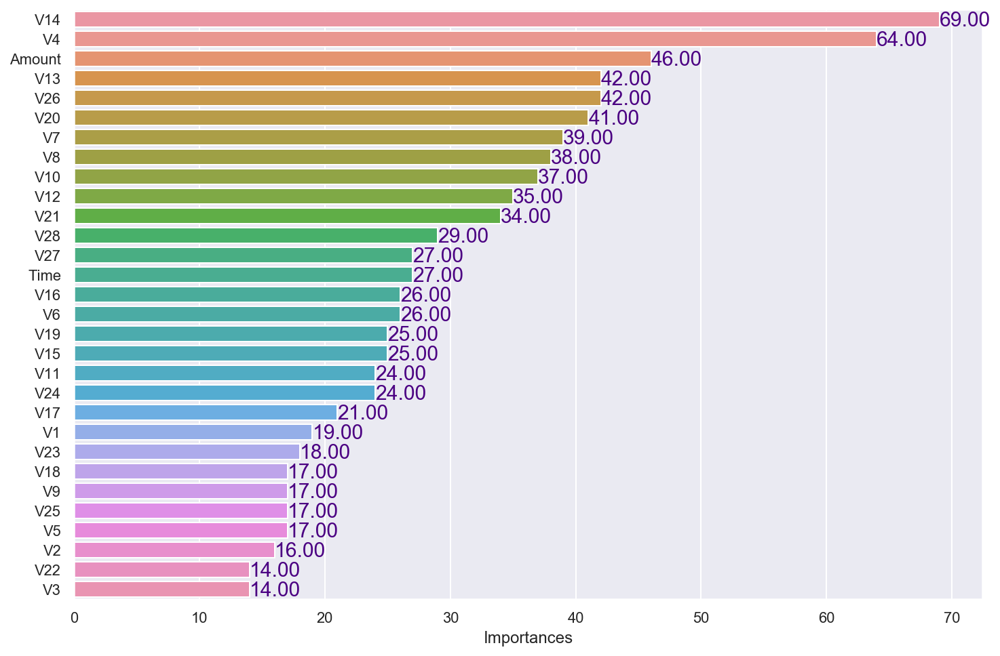

In [44]:
arr_fimp = clf_lgb.feature_importances_
df_fimp = pd.DataFrame(arr_fimp,columns=['Importances'],index=df.columns.drop(target))
df_fimp = df_fimp.sort_values('Importances',ascending=False)

plt.figure(figsize=(12,8))
ax = sns.barplot(x=df_fimp.Importances, y= df_fimp.index);

for p in ax.patches:
    x = p.get_width()
    y = p.get_y()
    text = '{:.2f}'.format(p.get_width())
    ax.text(x, y,text,fontsize=15,color='indigo',va='top',ha='left')

# LightGBM cross validation

In [45]:
%%time

X = df.drop('Class',axis=1).to_numpy()
y = df['Class'].to_numpy()

scores = cross_val_score(clf_lgb,
                         X,y,
                         scoring ='f1',
                         cv=5,
                         n_jobs=-1,
                         verbose=2)

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:   13.0s finished


CPU times: user 129 ms, sys: 119 ms, total: 248 ms
Wall time: 13 s


In [46]:
trace = go.Table(
    header=dict(values=['<b>F1 score mean<b>', '<b>F1 score std<b>'],
                line = dict(color='#7D7F80'),
                fill = dict(color='#a1c3d1'),
                align = ['center'],
                font = dict(size = 15)),
    cells=dict(values=[np.round(scores.mean(),6),
                       np.round(scores.std(),6)],
               line = dict(color='#7D7F80'),
               fill = dict(color='#EDFAFF'),
               align = ['center'], font = dict(size = 15)))

layout = dict(width=800, height=500,
              title = 'Cross validation - 5 folds [F1 score]',
              font = dict(size = 15))
fig = dict(data=[trace], layout=layout)
py.iplot(fig, filename = '../reports/figures/lightgbm_cross_validation.html')

# Model Interpretation

In [47]:
df.head(2)

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
49089,"43,906.0",1.22945163161131,-0.23547809342014997,-0.627166176593026,0.419876686357794,1.7970144128725902,4.06957351355633,-0.896222820828678,1.03610290328935,0.7459908914848721,-0.147303617066817,-0.8504591198868969,0.39784484914678103,-0.259848817905904,-0.27706481229579305,-0.7668096078635441,-0.200945651181999,-0.33812218853491904,0.0060320639939743,0.477430901243198,-0.0579220794338042,-0.170059936530346,-0.288750127884776,-0.130269704017547,1.02593454767083,0.8479897959683579,-0.271475768797189,0.0600516354538087,0.0181044226078747,1.99,0
154704,"102,638.0",2.01689328291807,-0.0887506140323742,-2.98925749222376,-0.142574646429249,2.6754269096775602,3.3322891485372,-0.652335736958001,0.752810605568787,1.96256617769606,-1.02502401594519,1.12697623363317,-2.41809318534608,1.25034117030654,-0.0562089192861053,-0.7366954780760729,0.0147825996970876,1.89024881227086,0.333754890035522,-0.45039760007425106,-0.14761854539952,-0.184152588578113,-0.0896614940934226,0.0871882082282043,0.5706785718151489,0.10189883376183399,0.620842034993261,-0.0489578543691194,-0.0428313119285419,6.99,0


## Model interpretation using eli5

In [48]:
import eli5

eli5.show_weights(clf_lgb)

Weight,Feature
0.3799,V14
0.2680,V10
0.1134,V12
0.0391,V4
0.0149,V7
0.0145,Amount
0.0130,V26
0.0112,V8
0.0110,V13
0.0108,V20


In [50]:
from eli5.sklearn import PermutationImportance

feature_names = df_Xtrain.columns.tolist()
perm = PermutationImportance(clf_lgb).fit(df_Xtest, ytx)
eli5.show_weights(perm, feature_names=feature_names)

Weight,Feature
0.0008 ± 0.0001,V14
0.0005 ± 0.0001,V10
0.0002 ± 0.0000,V4
0.0002 ± 0.0001,V12
0.0001 ± 0.0001,V26
0.0001 ± 0.0000,V11
0.0001 ± 0.0000,V16
0.0001 ± 0.0000,V8
0.0000 ± 0.0000,V17
0.0000 ± 0.0000,V7


## Model interpretation using lime

In [51]:
df.head(2)

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
49089,"43,906.0",1.22945163161131,-0.23547809342014997,-0.627166176593026,0.419876686357794,1.7970144128725902,4.06957351355633,-0.896222820828678,1.03610290328935,0.7459908914848721,-0.147303617066817,-0.8504591198868969,0.39784484914678103,-0.259848817905904,-0.27706481229579305,-0.7668096078635441,-0.200945651181999,-0.33812218853491904,0.0060320639939743,0.477430901243198,-0.0579220794338042,-0.170059936530346,-0.288750127884776,-0.130269704017547,1.02593454767083,0.8479897959683579,-0.271475768797189,0.0600516354538087,0.0181044226078747,1.99,0
154704,"102,638.0",2.01689328291807,-0.0887506140323742,-2.98925749222376,-0.142574646429249,2.6754269096775602,3.3322891485372,-0.652335736958001,0.752810605568787,1.96256617769606,-1.02502401594519,1.12697623363317,-2.41809318534608,1.25034117030654,-0.0562089192861053,-0.7366954780760729,0.0147825996970876,1.89024881227086,0.333754890035522,-0.45039760007425106,-0.14761854539952,-0.184152588578113,-0.0896614940934226,0.0871882082282043,0.5706785718151489,0.10189883376183399,0.620842034993261,-0.0489578543691194,-0.0428313119285419,6.99,0


In [53]:
idx = 0
example = df_Xtest.iloc[idx]
answer = ser_ytest.iloc[idx]
feature_names = df_Xtest.columns.tolist()

prediction = clf_lgb.predict(example.to_numpy().reshape(-1,1).T)


print(f'answer     = {answer}')
print('prediction = ', prediction[0])
print()
print(example)
print(feature_names)

/Users/poudel/miniconda3/envs/dataSc/lib/python3.7/site-packages/lightgbm/basic.py:194: UserWarning:

Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.



answer     = 0
prediction =  0

Time                140,847.0
V1           1.97810424832896
V2          -1.13831344405681
V3           -2.1922018760386
V4        -1.2122591108198302
V5       -0.45551242518347396
V6          -1.67741497316757
V7          0.385540468413684
V8        -0.7036782765396121
V9       -0.40130063214411793
V10       0.46093677250343396
V11        -0.901639302804755
V12       0.47068620331435396
V13         0.999954806447565
V14         0.220830330576048
V15      -0.23477255883805398
V16         -2.50480503995351
V17       0.25405136468609196
V18        0.9164368301187141
V19        -0.424507293828495
V20        -0.262310978829441
V21       0.21914443184277502
V22           1.1244171189556
V23      -0.34292638010626697
V24       0.20887505033663395
V25         0.538822923405322
V26          1.26167918049697
V27        -0.116888354352356
V28       -0.0629327012158857
Amount                  155.0
Name: 217317, dtype: float64
['Time', 'V1', 'V2', 'V3', 'V4', 'V5', 

In [54]:
import lime
import lime.lime_tabular

# categorical_features = []
# categorical_features_idx = [df_Xtrain.columns.get_loc(col) 
#                               for col in categorical_features]

NUM_FEATURES = len(feature_names)
explainer = lime.lime_tabular.LimeTabularExplainer(df_Xtrain.to_numpy(), 
               feature_names=feature_names, 
               class_names=['Not-fraud','Fraud'], 
               mode='classification')

exp = explainer.explain_instance(example, clf_lgb.predict_proba,
                                 num_features=NUM_FEATURES)
exp.show_in_notebook(show_table=True)

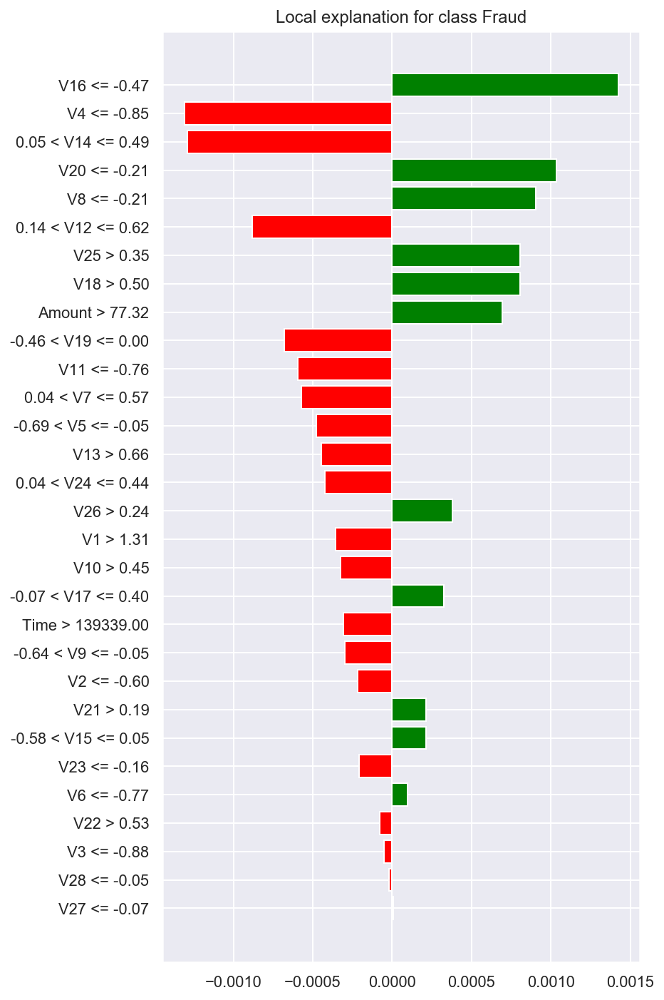

In [63]:
ax = exp.as_pyplot_figure(); # use semicolon
ax.set_figheight(12);

In [64]:
# show_method_attributes(ax,start='set')

## Model interpretation using shap
- [github link](https://github.com/slundberg/shap)
- [shap tutorial for ligtgbm](https://slundberg.github.io/shap/notebooks/tree_explainer/Census%20income%20classification%20with%20LightGBM.html)

In [65]:
import shap

shap.initjs()

In [84]:
show_method_attributes(shap)

Object Type: <class 'module'>



,0,1,2,3,4,5,6
0,BruteForceExplainer,PermutationExplainer,bar_plot,embedding_plot,image_plot,multioutput_decision_plot,save_html
1,DeepExplainer,SamplingExplainer,common,explainers,initjs,other,summary_plot
2,GradientExplainer,Tree,datasets,force_plot,kmeans,partial_dependence_plot,unsupported
3,KernelExplainer,TreeExplainer,decision_plot,have_matplotlib,matplotlib,plots,warnings
4,LinearExplainer,approximate_interactions,dependence_plot,hclust_ordering,monitoring_plot,sample,waterfall_plot
5,PartitionExplainer,,,,,,


In [81]:
%%time

explainer = shap.TreeExplainer(clf_lgb)
shap_values = np.array(explainer.shap_values(df_Xtest))

Setting feature_perturbation = "tree_path_dependent" because no background data was given.
LightGBM binary classifier with TreeExplainer shap values output has changed to a list of ndarray


CPU times: user 9.44 s, sys: 44.2 ms, total: 9.48 s
Wall time: 2.82 s


In [96]:
# shap.force_plot?

In [102]:
df_Xtest.shape, explainer.expected_value, type(explainer.expected_value), len(explainer.expected_value)

((56962, 30), [9.961221111327559, -9.961221111327559], list, 2)

In [104]:
idx = 5
shap.force_plot(explainer.expected_value[1],
                shap_values[1][idx,:],
                df_Xtest.iloc[idx,:] # this is just for giving feature names
               )

In [105]:
# many points
NUM = 1000
shap.force_plot(explainer.expected_value[1],
                shap_values[1][:NUM,:],
                df_Xtest.iloc[:NUM,:] # this is just for giving feature names
               )

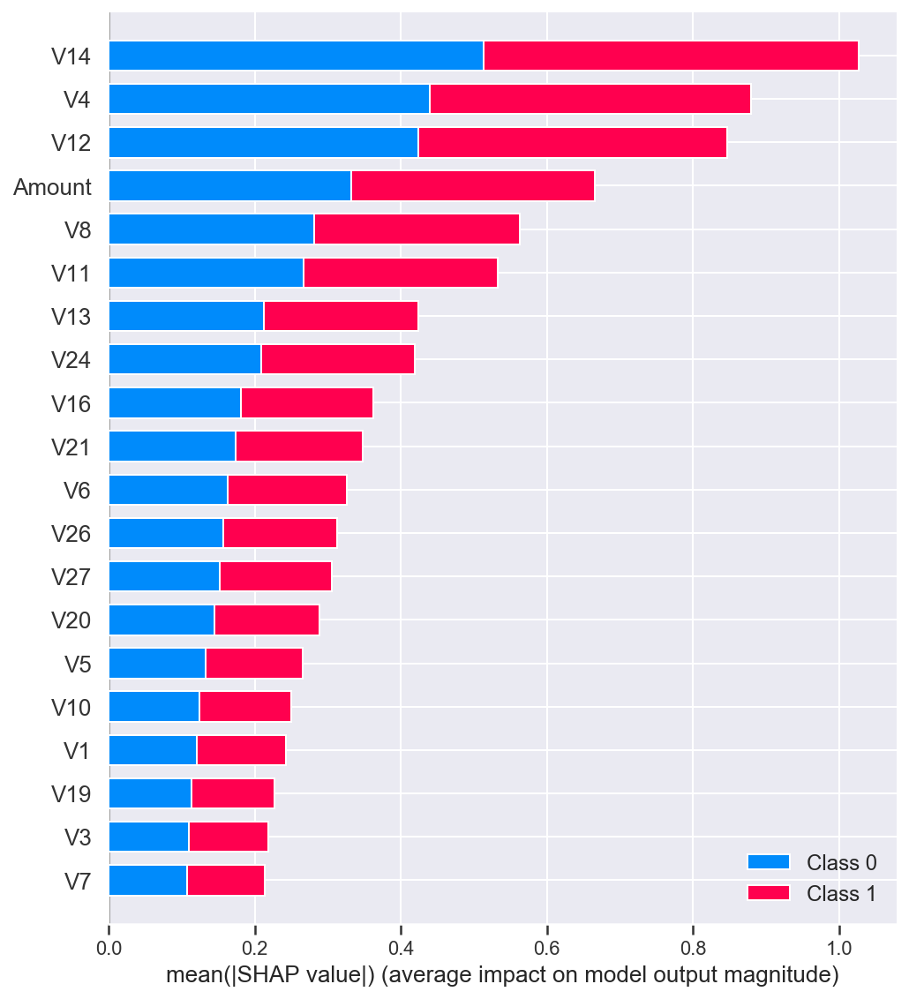

In [67]:
shap.summary_plot(shap_values, df_Xtest)

In [71]:
# shap.dependence_plot?

In [79]:
shap_values = shap.TreeExplainer(clf_lgb).shap_values(df_Xtest)

Setting feature_perturbation = "tree_path_dependent" because no background data was given.
LightGBM binary classifier with TreeExplainer shap values output has changed to a list of ndarray
